# **Detection & Segmentation**

## **1. Semantic Segmentation**

### **1.1 Theory**

**Segmentation** in computer vision refers to the process of partioning an image into multiple segments or regions based on certain criteria such as color, intensity, or texture.

There are several types of segmentation techniques, including semantic segmentation and instance segmentation. In this demonstration, we will only focus on the former.
- **Semantic Segmentation**:  In semantic segmentation, each pixel in the image is assigned a class label, indicating the object category to which it belongs. This approach aims to label each pixel with the class of the object it belongs to (e.g., person, car, road).
- **Instance Segmentation**: Instance segmentation goes a step further than semantic segmentation by not only labeling each pixel with its corresponding object class but also distinguishing between different instances of the same class. This means that each individual object instance in the image is assigned a unique label.

<div style="width: 500px; margin-left: auto; margin-right: auto;">
    <img src="https://www.folio3.ai/blog/wp-content/uploads/2023/05/SS.png" style="width:100%;">
</div>

<div style="width: 500px; margin-left: auto; margin-right: auto;">
    <img src="https://blog.roboflow.com/content/images/2022/10/MEB9F.png" style="width:100%;">
</div>

### **1.2 Realization**

**Naive Approach**

Semantic segmentation is, broadly speaking, akin to image classification, with the key distinction being the classification of individual pixels rather than the entire image. One naive approach to accomplish this is by using a sliding window technique, where a window moves across the image, attempting to classify each central pixel.

While this method does function, it comes with several drawbacks:
- It is highly inefficient as it fails to reuse features shared between patches.
- It does not effectively utilize spatial information. Varying sliding window sizes may result in different accuracy performances depending on the image's domain. Smaller windows may overlook the broader context, while larger ones may miss finer details.

<div style="width: 700px; margin-left: auto; margin-right: auto;">
    <img src="https://assets-global.website-files.com/614c82ed388d53640613982e/63f49ffccffe1b681a73e817_semantic%20segmentation%20idea%20sliding%20window.jpg" style="width:100%;">
</div>

**Fully Convolutional Neural Networks**

In this approach, the CNN is designed to take an input image and output a segmentation map where each pixel is assigned a class label. Instead of using fully connected layers (dense neural networks) at the end, the network ends with a convolutional layer that produces a feature map with dimensions C x H x W, where C is the number of classes and H and W are the height and width of the input image, respectively.

<div style="width: 700px; margin-left: auto; margin-right: auto;">
    <img src="https://assets-global.website-files.com/614c82ed388d53640613982e/63f4cb5336f5182778f257c2_semantic%20segmentation%20idea%20fully%20convolutional.jpg" style="width:100%;">
</div>

To elaborate:
- **Input Image**: The input to the network is an image of size H x W x D, where H and W are the height and width, and D is the number of channels (e.g., 3 for RGB images).
- **Convolutional Layers**: The input image passes through a series of convolutional layers, which extract features at different spatial scales. These layers capture hierarchical representations of the input image, learning to detect low-level features like edges and textures and then combining them to detect more complex patterns.
- **Final Convolutional Layer**: Instead of using fully connected layers, the network's final layer is a convolutional layer with C filters, where C is the number of classes. Each filter produces a feature map of the same spatial dimensions as the input image but with a depth of 1, representing the probability of each pixel belonging to the corresponding class.
 - **Activation Function**: Typically, a softmax activation function is applied to the output of the final convolutional layer. This function normalizes the values across each pixel's class probabilities, ensuring that they sum up to 1. This step provides a probability distribution over the classes for each pixel.
- **Inference**: To obtain the final segmentation map, the pixel-wise class probabilities are computed for each position in the feature map. For each pixel position (i, j), the class with the highest probability is selected as the predicted class label. This results in a segmentation map where each pixel is assigned the class label with the highest probability.

To visualize, imagine the k-th slice of the output layer as a matrix of the same width and height as the input image where (i,j)-th pixel represents the probability of that pixel belonging to the k-th class of our dataset

<div style="width: 700px; margin-left: auto; margin-right: auto;">
    <img src="https://assets-global.website-files.com/614c82ed388d53640613982e/63f4a113480f95d70a11e2d2_fully%20convolutional%20neural%20network.jpg" style="width:100%;">
</div>

While convolutional neural networks of this type outperform and are faster than the naive approach, they still encounter performance issues. When the training data comprises high-resolution images, performing convolutions at the original resolution of the input image across every hidden layer becomes computationally expensive.

**Fully Convolutional Networks with Up-sampling and Down-sampling**

To address this performance issue, we can consider employing various pooling layers to down-sample and up-sample the input image. This approach significantly reduces the number of parameters and operations required to train our neural network.

<div style="width: 700px; margin-left: auto; margin-right: auto;">
    <img src="https://assets-global.website-files.com/614c82ed388d53640613982e/63f4a18d672ee1f7a0ed0634_fully%20convolutional%20networks%20in%20up%20sampling%20and%20down%20sampling.jpg" style="width:100%;">
</div>

### **1.3 Implementation**

In [1]:
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image

import cv2

import torch
from torchvision import models, transforms

*[DeepLab](https://pytorch.org/vision/stable/models/deeplabv3.html?highlight=semantic+segmentation)* and *[FCNs](https://pytorch.org/vision/stable/models/fcn.html?highlight=semantic+segmentation)* are two popular architectures for semantic segmentation in PyTorch. Both of them are provided by the `torchvision.models.segmentation` library.

#### **1.3.1 FCN**

Since FCN is the architecture introduced by the professor in class, let's start with that.

The FCN model is available in two variations:

- **fcn_resnet50**: A Fully-Convolutional Network model with a ResNet-50 backbone.
- **fcn_resnet101**: A Fully-Convolutional Network model with a ResNet-101 backbone.

The initial step is to load the model as well as the corresponding transformation pipeline. Since we're not focusing on training, we'll proceed with the pre-trained version.

Be sure to modify the below code snippet depending on the model of interest (fcn_resnet50 or fcn_resnet101).

In [2]:
# Define the model name
model_name = 'fcn_resnet50'

# Load the model with specified weights
model = models.get_model(model_name, weights="DEFAULT")
model_weight = models.get_model_weights(model_name).DEFAULT

# Set the model to evaluation mode
model = model.eval()

# Get the preprocessor for the model weights
preprocessor = model_weight.transforms()

Let's go ahead and create a utility function to preprocess our images given the file path.

In [3]:
# Define a function to preprocess an image
def preprocess_image(image_path):
    # Open the image
    input_image = Image.open(image_path)
    # Apply preprocessing transformations to the image and add batch dimension
    input_tensor = preprocessor(input_image).unsqueeze(0)
    # Return the preprocessed image tensor
    return input_tensor

For this example, let's use the motorbike image. 

In [4]:
# Define the path to the input image
input_image_path = "./data/images/motorbike.jpeg"

# Preprocess the input image
input_tensor = preprocess_image(input_image_path)

We can now pass our image through the model to obtain the segmentation mask.

In [5]:
# Use torch.no_grad() to disable gradient computation
with torch.no_grad():
    # Pass the input tensor through the model and retrieve the output
    output = model(input_tensor)['out'][0]

# Apply argmax operation along the 0th dimension to get the class predictions
output_predictions = output.argmax(0)

The last step is to simply display the input image alongside the segmentation output.

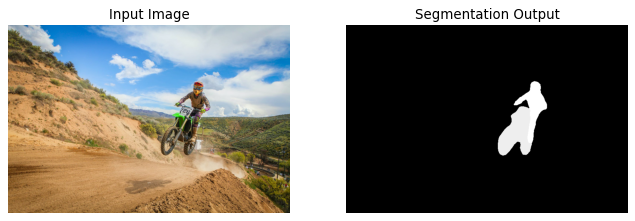

In [6]:
# Create a figure with a specific size
plt.figure(figsize=(10, 5))

# Plot the input image
plt.subplot(1, 2, 1)
plt.imshow(Image.open(input_image_path))
plt.title("Input Image")
plt.axis("off")

# Plot the segmentation output
plt.subplot(1, 2, 2)
plt.imshow(output_predictions, cmap='gray')
plt.title("Segmentation Output")
plt.axis("off")

# Display the plot
plt.show()

**Extra Features**

What if we wanted to fine-tune our output so that each identified class gets its own image?

First, let's retrieve all the possible classes the model was trained on.

In [7]:
# Define class labels
class_labels = model_weight.meta['categories']

# Print the class labels
print(class_labels)

['__background__', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']


Afterwards, let's calculate how many pixels of each class were identified.

In [8]:
# Iterate over each class index
for class_index in range(len(class_labels)):
    # Count the number of pixels belonging to the current class
    class_pixels = (output_predictions == class_index).sum().item()
    # Print the number of pixels for the current class
    print(f"'{class_labels[class_index]}' - {class_pixels} pixels")

'__background__' - 392298 pixels
'aeroplane' - 0 pixels
'bicycle' - 0 pixels
'bird' - 0 pixels
'boat' - 0 pixels
'bottle' - 0 pixels
'bus' - 0 pixels
'car' - 0 pixels
'cat' - 0 pixels
'chair' - 0 pixels
'cow' - 0 pixels
'diningtable' - 0 pixels
'dog' - 0 pixels
'horse' - 0 pixels
'motorbike' - 7923 pixels
'person' - 5379 pixels
'pottedplant' - 0 pixels
'sheep' - 0 pixels
'sofa' - 0 pixels
'train' - 0 pixels
'tvmonitor' - 0 pixels


Next, we'll create a separate binary mask for each identified class.

In [9]:
binary_masks = []  # List to store binary masks for each class
class_indices = []  # List to store indices of classes present in the segmentation output

# Iterate over each class index
for class_index in range(len(class_labels)):
    # Check if the class is present in the segmentation output
    if (output_predictions == class_index).sum() > 0:
        # Create a binary mask for the current class
        binary_mask = (output_predictions == class_index).float()
        # Append the binary mask to the list
        binary_masks.append(binary_mask)
        # Append the class index to the list of class indices
        class_indices.append(class_index)

The final step is simply to display a separate image for each identified class.

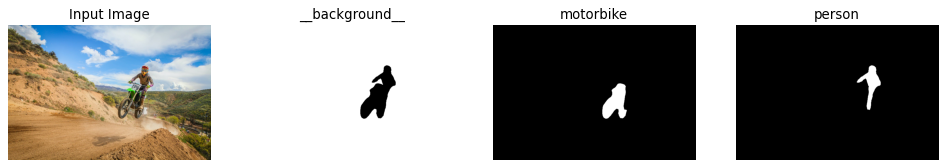

In [10]:
# Display results
plt.figure(figsize=(15, 5))

# Plot the input image
plt.subplot(1, len(binary_masks) + 1, 1)
plt.imshow(Image.open(input_image_path))
plt.title("Input Image")
plt.axis("off")

# Plot each binary mask along with its corresponding class label
for i, (class_index, binary_mask) in enumerate(zip(class_indices, binary_masks)):
    plt.subplot(1, len(binary_masks) + 1, i + 2)
    plt.imshow(binary_mask, cmap='gray')
    plt.title(class_labels[class_index])
    plt.axis("off")

# Show the plot
plt.show()

#### **1.3.2 DeepLab**

This portion is optional, but I proceeded with it because I found some really nice code online. Essentially, after segmenting each class, it overlays all the identified classes and highlights them on the original image. You can scroll down to the end of this segment to see what I mean.

Most of the code was copied from *[here](https://learnopencv.com/deeplabv3-ultimate-guide/#Semantic-Segmentation-Using-DeepLabv3-in-PyTorch)*.

We'll begin by defining a list `label_map` that contains an RGB color tuple for each class the model was trained on.

In [11]:
label_map = np.array([
    (0, 0, 0),  # background
    (128, 0, 0),  # aeroplane
    (0, 128, 0),  # bicycle
    (128, 128, 0),  # bird
    (0, 0, 128),  # boat
    (128, 0, 128),  # bottle
    (0, 128, 128),  # bus
    (128, 128, 128),  # car
    (64, 0, 0),  # cat
    (192, 0, 0),  # chair
    (64, 128, 0),  # cow
    (192, 128, 0),  # dining table
    (64, 0, 128),  # dog
    (192, 0, 128),  # horse
    (64, 128, 128),  # motorbike
    (192, 128, 128),  # person
    (0, 64, 0),  # potted plant
    (128, 64, 0),  # sheep
    (0, 192, 0),  # sofa
    (128, 192, 0),  # train
    (0, 64, 128),  # tv/monitor
])

Next, we will define two utility functions to assist in processing and plotting the segmentation results:

- `draw_segmentation_map(...)`: This function decodes the model outputs and determines the RGB value for each pixel based on the predicted class.

- `image_overlay(...)`: This function combines two images with weights. It'll be used to to overlay the segmentation maps onto the raw image.

In [12]:
# Function to draw segmentation map using predicted outputs
def draw_segmentation_map(outputs):
    # Get the predicted labels by taking the argmax along the channel dimension
    labels = torch.argmax(outputs.squeeze(), dim=0).numpy()
    
    # Initialize empty arrays for red, green, and blue maps
    red_map = np.zeros_like(labels).astype(np.uint8)
    green_map = np.zeros_like(labels).astype(np.uint8)
    blue_map = np.zeros_like(labels).astype(np.uint8)
    
    # Iterate over each class in the label map
    for label_num in range(len(label_map)):
        # Find pixels corresponding to the current class
        index = labels == label_num
         
        # Get the RGB values for the current class from the label map
        R, G, B = label_map[label_num]
  
        # Assign RGB values to corresponding pixels in the maps
        red_map[index] = R
        green_map[index] = G
        blue_map[index] = B
  
    # Stack the RGB maps to form the segmentation map
    segmentation_map = np.stack([red_map, green_map, blue_map], axis=2)
    return segmentation_map

# Function to overlay segmentation map on the original image
def image_overlay(image, segmented_image):
    alpha = 1  # transparency for the original image
    beta = 0.8  # transparency for the segmentation map
    gamma = 0  # scalar added to each sum
    
    # Convert images to OpenCV's BGR format
    image = np.array(image)
    segmented_image = cv2.cvtColor(segmented_image, cv2.COLOR_RGB2BGR)
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    
    # Overlay the segmentation map on the original image using weighted addition
    cv2.addWeighted(image, alpha, segmented_image, beta, gamma, image)
  
    return image

The function `load_model(...)` accepts the name of the backbone model to utilize, loads it, and returns the model along with the necessary pre-processing transformations to ensure correct usage of the model.

In [13]:
def load_model(model_name: str):
    # Check if the model name is valid
    if model_name.lower() not in ("deeplabv3_mobilenet_v3_large", "deeplabv3_resnet_50", "deeplabv3_resnet_101"):
        raise ValueError("'model_name' should be one of ('deeplabv3_mobilenet_v3_large', 'deeplabv3_resnet_50', 'deeplabv3_resnet_101')")
    
    # Load the appropriate model based on the model name
    if model_name == "deeplabv3_resnet_50":
        model = models.segmentation.deeplabv3_resnet50(weights=models.segmentation.DeepLabV3_ResNet50_Weights.DEFAULT)
        transforms = models.segmentation.DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1.transforms()
    elif model_name == "deeplabv3_resnet_101":
        model = models.segmentation.deeplabv3_resnet101(weights=models.segmentation.DeepLabV3_ResNet101_Weights.DEFAULT)
        transforms = models.segmentation.DeepLabV3_ResNet101_Weights.COCO_WITH_VOC_LABELS_V1.transforms()
    else:
        model = models.segmentation.deeplabv3_mobilenet_v3_large(weights=models.segmentation.DeepLabV3_MobileNet_V3_Large_Weights.DEFAULT)
        transforms = models.segmentation.DeepLabV3_MobileNet_V3_Large_Weights.COCO_WITH_VOC_LABELS_V1.transforms()
  
    # Set the model to evaluation mode
    model.eval()
  
    # Warmup run to initialize the model
    _ = model(torch.randn(1, 3, 520, 520))
  
    return model, transforms

Next, we define one final function, `perform_inference(...)`, which handles the following tasks:

- Loading and preprocessing images
- Making a call to the model
- Post-processing, plotting, and saving the results.

In [14]:
def perform_inference(model_name: str, img_path):
    # Load the segmentation model and associated transformations
    model, transforms = load_model(model_name)
    
    # Load and pre-process the input image
    img_raw = Image.open(img_path).convert("RGB")
    W, H = img_raw.size[:2]
    img_t = transforms(img_raw)
    img_t = torch.unsqueeze(img_t, dim=0)

    # Perform model inference
    with torch.no_grad():
        output = model(img_t)["out"].cpu()

    # Get RGB segmentation map
    segmented_image = draw_segmentation_map(output)

    # Resize the segmentation map to match the original image size
    segmented_image = cv2.resize(segmented_image, (W, H), cv2.INTER_LINEAR)
    
    # Overlay the segmentation map on the original image
    overlayed_image = image_overlay(img_raw, segmented_image)
     
    # Plot the original image, segmentation map, and overlayed image
    plt.figure(figsize=(12, 10), dpi=100)
    plt.subplot(1, 3, 1)
    plt.axis("off")
    plt.title("Image")
    plt.imshow(np.asarray(img_raw))

    plt.subplot(1, 3, 2)
    plt.title("Segmentation")
    plt.axis("off")
    plt.imshow(segmented_image)

    plt.subplot(1, 3, 3)
    plt.title("Overlayed")
    plt.axis("off")
    plt.imshow(overlayed_image[:, :, ::-1])  # Convert BGR to RGB for display
     
    plt.show()
    plt.close()
  
    return

Now, we simply need to call the perform_inference() method with the model name and file path as arguments.

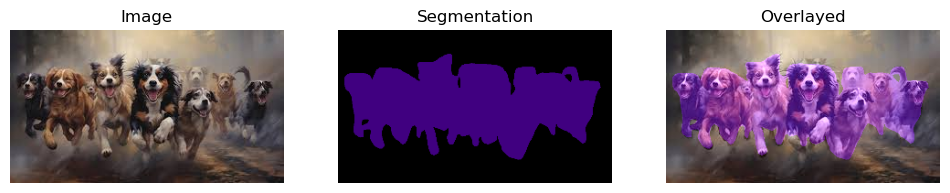

In [15]:
perform_inference("deeplabv3_resnet_101", './data/images/dogs.jpg')

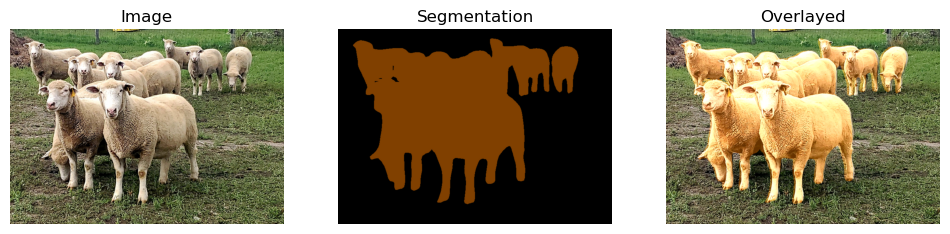

In [16]:
perform_inference("deeplabv3_resnet_101", './data/images/sheep.jpg')

## **2. Object Detection**

### **2.1 Theory**

In computer vision, detection can be categorized into object localization or object detection.
- **Object localization**: Object localization involves determining both **what** and **where** a **single object** exists in a given image.
- **Object Detection**: Object detection entails identifying both **what** and **where** **multiple objects** exist in a given image.

<div style="width: 600px; margin-left: auto; margin-right: auto;">
    <img src="https://res.cloudinary.com/practicaldev/image/fetch/s--JhcLAK3U--/c_limit%2Cf_auto%2Cfl_progressive%2Cq_auto%2Cw_880/https://dev-to-uploads.s3.amazonaws.com/uploads/articles/7qgc1cav8ch27bdqxo9n.png" style="width:100%;">
</div>

### **2.2 Realization**

#### **2.2.1 Object Localization**

Object localization can be divided into two main components. The first is classification, which is relatively straightforward. All we have to do is feed the image into a pretrained model. The second component, localization, will be treated as a regression problem.

Since the bounding box consists of 4 points, we'll need 8 nodes (four for the x-coordinates and four for the y-coordinates). However, upon consideration, we realize that not all 8 values are necessary, as 4 of them will be duplicates. Therefore, we only require 4 output nodes.

There are two common approaches for utililzing these 4 output nodes. The first is to consider the first two nodes as the x and y coordinates of the top-left point, while the last two nodes represent the coordinates of the bottom-right point. Alternatively, the first two nodes could represent the coordinates of the top-left point, while the last two nodes denote the width and height of the bounding box, respectively.

Using this approach, we'll find that object localization becomes quite straightforward. Next, we'll explore how to adapt this method to implement object detection.

#### **2.2.2 Object Detection**

**Sliding Window Approach**

The natural extension of the aforementioned method involves using a sliding window (bounding box). Initially, we crop our input image to match the model's input size, for example, 224 by 224 pixels. Then, we generate a bounding box and check whether any object is present within that region. Subsequently, we slide the bounding box according to a specified stride and repeat the process for the next region.

However, this approach encounters a significant computational cost due to two main reasons:

- Moving the bounding box by just one pixel at a time to cover the entire image, particularly with high-resolution images, leads to slow processing and strains our model.
- The variable size of the bounding box necessitates running multiple types of bounding boxes through our model. Consequently, we not only feed multiple crops of the input image to the model but also various bounding box sizes, which further exacerbates computational demands.

Another issue worth noting is that the same object is likely to appear multiple times for different bounding boxes. We need to determine the ideal bounding box to encapsulate that object. To address this, we can make use of non-maximum suppression, although we won't delve into that here.

The next two approaches address the first issue, which is optimizing computational cost.

**R-CNNs (Regional Based Networks)**

The basic idea of Region-Based Networks is to apply an algorithm to an input image that extracts potential bounding boxes for objects within the image. Subsequently, all these potential regions are resized, for instance, to 224 by 224 pixels, and then fed into the network.

The benefit of this procedure is that we only have a fixed number of regions (usually around 2000) determined by the algorithm, which is significantly fewer than the number of regions we would have obtained using the sliding window method. Additionally, we don't have to worry about determining the bounding box size, as this is solved by the selective search algorithm.

Again, the issue of computational cost persists, making it unsuitable for real-time object detection. Additionally, it complicates the problem by requiring us to first determine the best proposal regions for object detection before detecting the objects themselves.

<div style="width: 600px; margin-left: auto; margin-right: auto;">
    <img src="https://lh6.googleusercontent.com/L-hLr-fL1mBUzKYMtNOeQZgF0CCw1rmE4230m90o-PctazAed_18_3G9f_FI7Qgo-Z5o3Lf_ZuDwC-YcwpyXpasCAq8xkRB2yHxMucN-sSal7SYsPCiWn558XuRUD2F5xP41h5Stb1Q2xmvHVaSH1LQ" style="width:100%;">
</div>

It's also noteworthy that several papers have been published on this topic. The models were named R-CNN, Fast R-CNN, and Faster R-CNN. Particularly, the Faster R-CNN model is a suitable candidate for real-time object detection.

**YOLO (You Only Learn Once)**

All previous object detection algorithms use regions to localize objects within the image. Instead of examining the entire image, these networks focus on parts of the image with high probabilities of containing objects. YOLO, or You Only Look Once, is a distinct object detection algorithm from the region-based ones mentioned earlier. In YOLO, a single convolutional network predicts both bounding boxes and class probabilities for these boxes.

Here's how YOLO works:
- We divide an image into an S×S grid.
- Within each grid cell, we consider m bounding boxes.
- For each bounding box, the network outputs a class probability and offset values.
- We select bounding boxes with class probabilities above a certain threshold to locate objects within the image.

YOLO is significantly faster than other object detection algorithms. However, it has limitations, particularly in detecting small objects within the image, such as a flock of birds. This is because of the spatial constraints of the algorithm.

<div style="width: 600px; margin-left: auto; margin-right: auto;">
    <img src="https://miro.medium.com/v2/resize:fit:1400/format:webp/1*JniWRt-ceWLNlkOULjhdpg.png" style="width:100%;">
</div>

### **2.3 Implementation**

For the implementation, we will discuss the use of *[Faster R-CNN](https://pytorch.org/vision/main/models/faster_rcnn.html)* and *[YOLO](https://pytorch.org/hub/ultralytics_yolov5/)* architectures. We will start with YOLO since that is the architecture the professor used in class.

#### **2.3.1 YOLO**

Unfortunately, PyTorch does not provide its own implementation of YOLO. Therefore, we'll need to import Ultralytics and utilize its YOLO model, which is built using PyTorch. 

While you could install Ultralytics through the command line, Jupyter allows you to execute command line instructions directly from within the notebook itself. Simply prepend the command line instruction with a '!' character.

In [32]:
!pip install -U ultralytics

Let's load the YOLOv5s model. (Note that most of this code is copied from the provided [link](https://pytorch.org/hub/ultralytics_yolov5/))

In [17]:
# Load YOLOv5 model from Ultralytics repository
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)

Using cache found in C:\Users\salman/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2024-5-2 Python-3.10.14 torch-2.2.2+cpu CPU

100%|██████████| 14.1M/14.1M [00:00<00:00, 16.3MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


Now, let's pass in the image of interest. Fortunately, the model accepts URLs, file paths, PIL images, OpenCV images, NumPy arrays, and tensors.

In [18]:
img_paths = [
    './data/images/motorbike.jpeg',
    './data/images/sheep.jpg',
    './data/images/dogs.jpg'
]

Run the model.

In [19]:
results = model(img_paths)

There are several ways to view the output of the model. The two we'll explore are displaying the results as a Pandas dataframe and, of course, displaying the results on the input image.

Before that, the quickest way to view the results is to simply print the output object.

In [38]:
results

YOLOv5 <class 'models.common.Detections'> instance
image 1/3: 1000x1500 1 person, 1 motorcycle
image 2/3: 1248x1754 11 sheeps
image 3/3: 168x300 7 dogs
Speed: 16.7ms pre-process, 141.9ms inference, 8.1ms NMS per image at shape (3, 3, 480, 640)

To view the results as a pandas dataframe:

In [20]:
import pandas as pd

# Initialize an empty list to store results
all_results = []

# Loop through each image's results
for i in range(len(img_paths)):
    # Get results for the i-th image and append to the list
    all_results.append(results.pandas().xyxy[i])

# Concatenate all results into a single dataframe
df = pd.concat(all_results, ignore_index=True)

# Print or use the dataframe as needed
df

,xmin,ymin,xmax,ymax,confidence,class,name
0,806.934204,409.110077,1065.880127,696.376404,0.863145,3,motorcycle
1,885.415649,296.760681,1078.140747,639.017944,0.740975,0,person
2,1365.953003,109.778122,1549.862305,412.111450,0.898601,18,sheep
3,1130.246460,118.159599,1365.473145,429.598846,0.893019,18,sheep
4,176.659607,320.829895,603.375610,1031.135254,0.872318,18,sheep
5,974.853394,60.012711,1237.136841,263.506104,0.817325,18,sheep
6,488.479523,311.015015,1222.018066,1123.102051,0.813098,18,sheep
7,805.019165,187.320282,1092.809082,431.946320,0.791499,18,sheep
8,81.983185,76.700897,454.721649,380.995361,0.770118,18,sheep
9,344.711029,158.876678,617.309326,388.107269,0.721011,18,sheep


To view the results by labeling the original image:

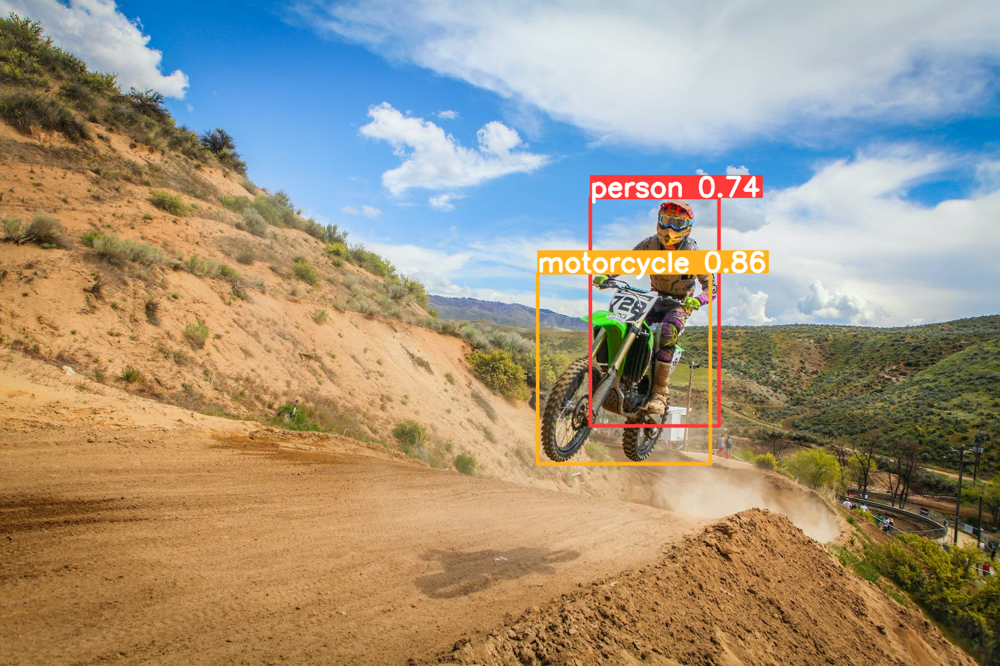

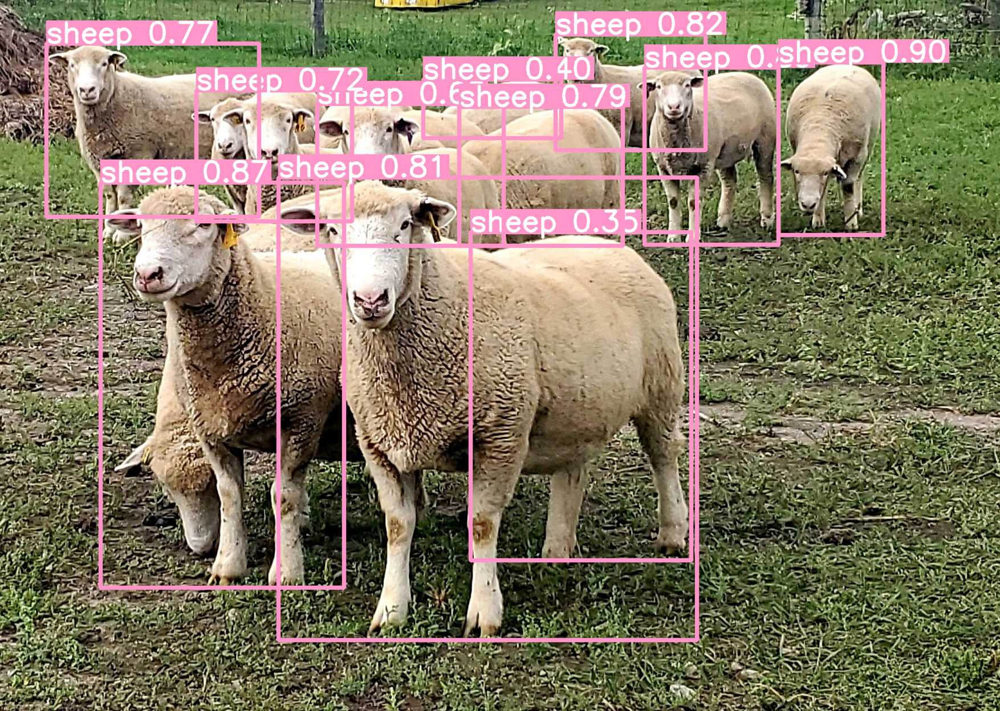

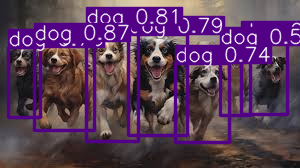

In [21]:
results.show()

#### **2.3.2 R-CNN**

In [1]:
from matplotlib import pyplot as plt
from matplotlib import patches

from PIL import Image

import torch

from torchvision import transforms
from torchvision import models

The first step is to load in the pre-trained model.

In [2]:
# Define the model name
model_name = 'fasterrcnn_mobilenet_v3_large_320_fpn'

# Load the model with specified weights
model = models.get_model(model_name, weights="DEFAULT")
model_weight = models.get_model_weights(model_name).DEFAULT

# Set the model to evaluation mode
model = model.eval()

# Get the preprocessor for the model weights
preprocessor = model_weight.transforms()

Define a convenience function to preprocess the image.

In [3]:
# Define a function to preprocess an image
def preprocess_image(image_path):
    # Open the image
    input_image = Image.open(image_path)
    # Apply preprocessing transformations to the image and add batch dimension
    input_tensor = preprocessor(input_image).unsqueeze(0)
    # Return the preprocessed image tensor
    return input_tensor

For this example, let's go with the parrot picture.

In [4]:
# Define the path to the input image
input_image_path = "./data/images/parrots.jpg"

# Preprocess the input image
input_tensor = preprocess_image(input_image_path)

Run the image through the model to get it's predictions

In [5]:
# Use torch.no_grad() to disable gradient computation
with torch.no_grad():
    # Pass the input tensor through the model and retrieve the output
    output = model(input_tensor)

Let's print all the bounding boxes that the model predicted, along with the corresponding class labels. We'll apply a filter to only display predictions with a high confidence score.

In [6]:
# Get class names
class_names = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]

In [7]:
# Set the minimum score threshold for detection
min_score_threshold = 0.90

# Print detected objects and their bounding boxes if they surpass the minimum score threshold
print("Detected Objects:\n")
for i in range(len(output[0]['boxes'])):
    # Extract bounding box, label, and score for each detected object
    box = output[0]['boxes'][i]
    label = output[0]['labels'][i]
    score = output[0]['scores'][i]
    
    # Check if the score is above the threshold
    if score > min_score_threshold:
        # Print information about the detected object
        print(f"Object {i+1}: Class Label '{class_names[label]}', Score: {score.item() * 100:.2f} %")
        print(f"Bounding Box: {box}")
        print()

Detected Objects:

Object 1: Class Label 'bird', Score: 99.87 %
Bounding Box: tensor([ 352.3757,  683.4507, 1903.4236, 2364.1748])

Object 2: Class Label 'bird', Score: 99.59 %
Bounding Box: tensor([2334.5483,  633.0250, 3893.9512, 2364.7405])



Now, all we need to do is draw these bounding boxes on the original image, along with the corresponding class names.

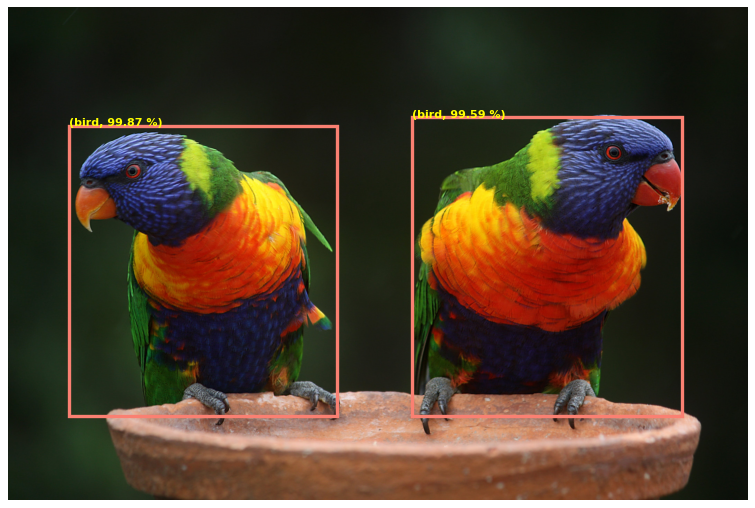

In [8]:
# Create a figure and axis object for visualization
fig, ax = plt.subplots(1, figsize=(12, 8))

# Display the input image
ax.imshow(Image.open(input_image_path))

# Draw bounding boxes around detected objects with scores above the threshold
for i in range(len(output[0]['boxes'])):
    box = output[0]['boxes'][i]
    label = output[0]['labels'][i]
    score = output[0]['scores'][i]

    if score > min_score_threshold:
        # Create a rectangle patch
        rect = patches.Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1], linewidth=3, edgecolor='salmon', facecolor='none')

        # Add the patch to the Axes
        ax.add_patch(rect)

        # Add label, class name, and score to the bounding box
        ax.text(box[0], box[1], f"({class_names[label]}, {score.item() * 100:.2f} %)", color='yellow', fontweight='bold')

# Turn off axis
plt.axis('off')

# Show the image with bounding boxes
plt.show()

In [9]:
# Perform Object Detection on Multiple Images
def detect_objects(image_paths, model, class_names, preprocess_image, min_score_threshold=0.90):

    # Iterate through each image path
    for image_path in image_paths:
        print(f"Processing image: {image_path}")
        
        # Preprocess the input image
        input_tensor = preprocess_image(image_path)

        # Use torch.no_grad() to disable gradient computation
        with torch.no_grad():
            # Pass the input tensor through the model and retrieve the output
            output = model(input_tensor)

        # Create a figure and axis object for visualization
        fig, ax = plt.subplots(1, figsize=(12, 8))

        # Display the input image
        ax.imshow(Image.open(image_path))

        # Draw bounding boxes around detected objects with scores above the threshold
        for i in range(len(output[0]['boxes'])):
            box = output[0]['boxes'][i]
            label = output[0]['labels'][i]
            score = output[0]['scores'][i]

            if score > min_score_threshold:
                # Create a rectangle patch
                rect = patches.Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1], linewidth=3, edgecolor='salmon', facecolor='none')

                # Add the patch to the Axes
                ax.add_patch(rect)

                # Add label, class name, and score to the bounding box
                ax.text(box[0], box[1], f"({class_names[label]}, {score.item() * 100:.2f} %)", color='yellow', fontweight='bold')

        # Turn off axis
        plt.axis('off')

        # Show the image with bounding boxes
        plt.show()

Processing image: ./data/images/sheep.jpg


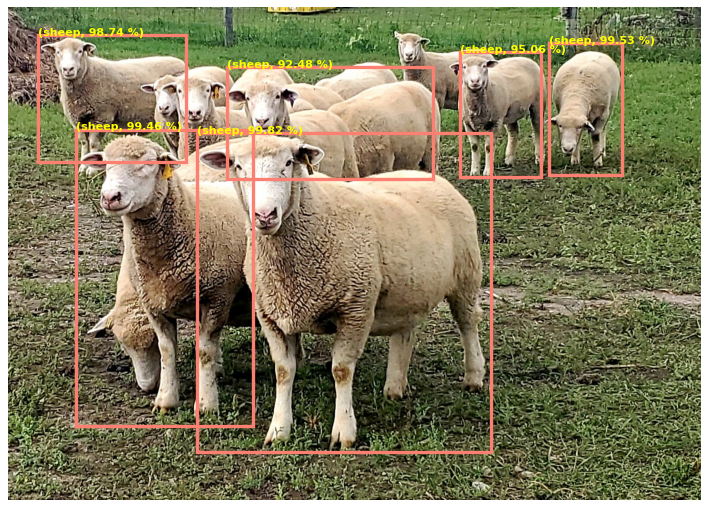

Processing image: ./data/images/dogs.jpg


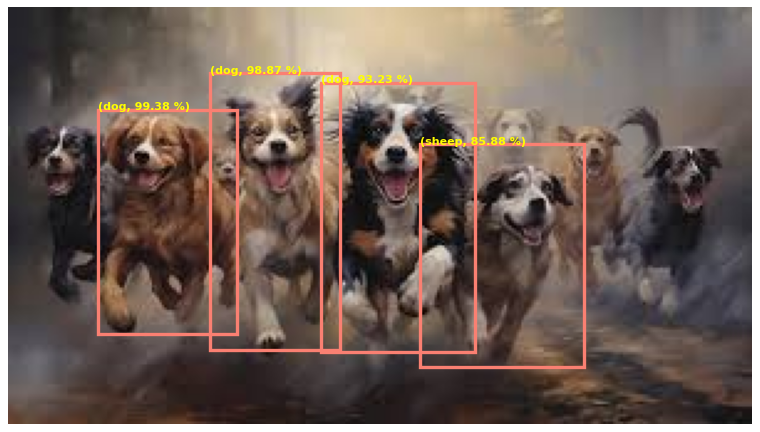

In [20]:
image_paths = ["./data/images/sheep.jpg", "./data/images/dogs.jpg"]
detect_objects(image_paths, model, class_names, preprocess_image, min_score_threshold=0.80) # Play around w/ min_score_threshold